# Introduction and acknowledgements

This notebook will take a look at Airbnb listings in London. I spent three exciting years here while completing my undergrad at the London School of Economics. London holds many fond memories for me!

We will focus on visualisations, using some new techniques of data & analysis that I've learnt on the job. First, we shall perform discovery and analysis on jupyter. Next, we deploy this in a dashboard using Bokeh!

We also aspire to make this into a decision-support tool. Therefore, we shall attempt to provide insights for both tourists as well as Airbnb itself

I've always enjoyed visualising data, and building things that users can interact with. Hope you find this useful!

Acknowledgements:
- https://www.kaggle.com/erikbruin/airbnb-the-amsterdam-story-with-interactive-maps [was inspired by this notebook, thank you for the amazing work you do Erik Bruinn!]
- https://github.com/rweng18/bokeh_map

Data source: http://insideairbnb.com/london/

Relevant articles:
- https://qz.com/876984/airbnb-is-gradually-losing-one-of-its-biggest-advantages-over-hotels/
- https://www.wired.co.uk/article/airbnb-growth-london-housing-data-insideairbnb

# 1) Import packages and data

In [173]:
import pandas as pd
import os
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import plotly.express as px
import folium
from folium.plugins import FastMarkerCluster # technique learnt from Erik Bruin
import re
from sklearn.feature_extraction.text import CountVectorizer
from wordcloud import WordCloud

%matplotlib inline

In [174]:
pd.set_option('display.max_columns', None) #set full rows

In [175]:
raw_data_path = "./DATA/"

In [176]:
for datafile in os.listdir(raw_data_path):
    print(datafile)

calendar.csv
listings.csv
listings_summary.csv
neighbourhoods.csv
neighbourhoods.geojson
reviews.csv
reviews_summary.csv


Descriptions of data (from https://www.kaggle.com/erikbruin/airbnb-the-amsterdam-story-with-interactive-maps)

- *calendar.csv.gz*: The calendar has 365 records for each listing. It specifies the whether the listing is available on a particular day (365 days ahead), and the price on that day.
- *listings_summary.csv*: A listing is basically an advertisement. This file holds the most useful variables that can be used visualizations.
- *listings.csv*: This file holds the same variables as the listing file plus 80 additional variables.
- *neighbourhoods.csx*: Simple file with the names of the neighbouhoods
- *reviews_summary.csv*: This is a simple file that can be used to count the number of reviews by listing (for a specific period). We don't load this data.
- *reviews.csv: This file holds the full details of all reviews, and can also be used for instance for text mining.
- *neighbourhoods.geojson*: This is the shape file that can be used in conjunction with interactive maps (such as Leaflet for R of the Python folium package).

In [177]:
df_listings = pd.read_csv(raw_data_path + "listings_summary.csv")
df_listings.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,11551,Arty and Bright London Apartment in Zone 2,43039,Adriano,NaN,Lambeth,51.46225,-0.11732,Entire home/apt,88,3,185,2019-09-15,1.58,2,336
1,13913,Holiday London DB Room Let-on going,54730,Alina,NaN,Islington,51.56802,-0.11121,Private room,65,1,19,2019-10-07,0.17,2,365
2,90700,Sunny Notting Hill flat & terrace,491286,Chil,NaN,Kensington and Chelsea,51.51074,-0.19853,Entire home/apt,105,2,339,2019-07-30,3.33,2,268
3,15400,Bright Chelsea Apartment. Chelsea!,60302,Philippa,NaN,Kensington and Chelsea,51.48796,-0.16898,Entire home/apt,100,30,88,2019-09-23,0.73,1,158
4,92399,"MODERN SELF CONTAINED ARCHITECT FLATLET, ISLIN...",497366,Andrea & Mark,NaN,Islington,51.55071,-0.08547,Private room,77,1,207,2019-10-21,2.04,2,336


In [178]:
df_listings.shape

(85068, 16)

In [179]:
df_listings_details = pd.read_csv(raw_data_path + 'listings.csv')   

D:\PYTHON_ENVIRONMENTS\AIRBNB\envs_airbnb\lib\site-packages\IPython\core\interactiveshell.py:3062: DtypeWarning:

Columns (61,62,94,95) have mixed types.Specify dtype option on import or set low_memory=False.



In [180]:
df_listings_details.head()

,id,listing_url,scrape_id,last_scraped,name,summary,space,description,experiences_offered,neighborhood_overview,notes,transit,access,interaction,house_rules,thumbnail_url,medium_url,picture_url,xl_picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,street,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,city,state,zipcode,market,smart_location,country_code,country,latitude,longitude,is_location_exact,property_type,room_type,accommodates,bathrooms,bedrooms,beds,bed_type,amenities,square_feet,price,weekly_price,monthly_price,security_deposit,cleaning_fee,guests_included,extra_people,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,requires_license,license,jurisdiction_names,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,11551,https://www.airbnb.com/rooms/11551,20191105115249,2019-11-06,Arty and Bright London Apartment in Zone 2,Unlike most rental apartments out there my fla...,"Amenities Bedding: 1 Double bed, 1 living room...",Unlike most rental apartments out there my fla...,family,Not even 10 minutes by metro from Victoria Sta...,No Smoking (very strict) Check-in time is afte...,Tons of buses (24hrs) go into central London f...,Guest will have access to the entire apartment,No interaction with guests as you book the ent...,No Smoking (very strict) No pets are allowed i...,NaN,NaN,https://a0.muscache.com/im/pictures/1d720898-c...,NaN,43039,https://www.airbnb.com/users/show/43039,Adriano,2009-10-03,"London, England, United Kingdom","Hello, I'm a friendly Italian man with a very ...",within an hour,100%,NaN,t,https://a0.muscache.com/im/pictures/user/47773...,https://a0.muscache.com/im/pictures/user/47773...,Brixton,3.0,3.0,"['email', 'phone', 'reviews', 'jumio', 'offlin...",t,t,"London, United Kingdom",Brixton,Lambeth,NaN,London,NaN,SW9 8DG,London,"London, United Kingdom",GB,United Kingdom,51.46225,-0.11732,t,Apartment,Entire home/apt,4,1.0,1.0,1.0,Real Bed,"{TV,""Cable TV"",Internet,Wifi,Kitchen,""Paid par...",NaN,$88.00,$645.00,"$2,350.00",$400.00,$30.00,2,$20.00,3,180,3,3,180,180,3.0,180.0,4 days ago,t,17,41,61,336,2019-11-06,185,2,2010-03-21,2019-09-15,92.0,9.0,9.0,10.0,10.0,9.0,9.0,f,NaN,NaN,t,f,strict_14_with_grace_period,f,t,2,2,0,0,1.58
1,38151,https://www.airbnb.com/rooms/38151,20191105115249,2019-11-06,Double room/ lounge,NaN,"Comfortable, large double room /lounge area av...","Comfortable, large double room /lounge area av...",none,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,https://a0.muscache.com/im/pictures/214176/451...,NaN,163634,https://www.airbnb.com/users/show/163634,Lisa,2010-07-11,GB,NaN,NaN,NaN,NaN,f,https://a0.muscache.com/defaults/user_pic-50x5...,https://a0.muscache.com/defaults/user_pic-225x...,Crystal Palace,1.0,1.0,['phone'],f,f,"Upper Norwood, Surrey, United Kingdom",LB of Croydon,Croydon,NaN,Upper Norwood,Surrey,SE19 3EJ,London,"Upper Norwood, United Kingdom",GB,United Kingdom,51.41940,-0.08722,f,Apartment,Private room,2,NaN,1.0,NaN,Real Bed,{},NaN,$65.00,NaN,NaN,NaN,NaN,1,$0.00,1,730,1,1,730,730,1.0,730.0,never,t,30,60

In [181]:
df_listings_details.shape

(85068, 106)

In [182]:
df_reviews_details = pd.read_csv(raw_data_path + 'reviews.csv')
print(df_reviews_details.shape)

(1486236, 6)


In [183]:
df_reviews_details.columns

Index(['listing_id', 'id', 'date', 'reviewer_id', 'reviewer_name', 'comments'], dtype='object')

In [184]:
df_calendar = pd.read_csv(raw_data_path + 'calendar.csv')
print(df_calendar.shape)

(31050094, 7)


# 2.1) Exploratory analysis - listings

In this section, we will study the various columns in our listing dataset. Before that, we will do some cleanup and joins to enrich our data.

## 2.X Join listings with listing_details, to enrich our data

In [185]:
df_listings.columns

Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood_group',
       'neighbourhood', 'latitude', 'longitude', 'room_type', 'price',
       'minimum_nights', 'number_of_reviews', 'last_review',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365'],
      dtype='object')

In [186]:
df_listings.dtypes

id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood_group               float64
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
dtype: object

In [187]:
df_listings_details.columns

Index(['id', 'listing_url', 'scrape_id', 'last_scraped', 'name', 'summary',
       'space', 'description', 'experiences_offered', 'neighborhood_overview',
       ...
       'instant_bookable', 'is_business_travel_ready', 'cancellation_policy',
       'require_guest_profile_picture', 'require_guest_phone_verification',
       'calculated_host_listings_count',
       'calculated_host_listings_count_entire_homes',
       'calculated_host_listings_count_private_rooms',
       'calculated_host_listings_count_shared_rooms', 'reviews_per_month'],
      dtype='object', length=106)

Based on reference notebook, as well as inspecting the full listings sheet, we can consider bringing these columns in to our main listings sheet.

In [188]:
cols_to_pull = ["id","property_type", "accommodates", "first_review", "review_scores_value", 
                "review_scores_cleanliness", "review_scores_location", "review_scores_accuracy", 
                "review_scores_communication", "review_scores_checkin", "review_scores_rating", 
                "maximum_nights", "listing_url", 
                "host_is_superhost", "host_about", "host_response_time", "host_response_rate", 
                "street", "price", "weekly_price", "monthly_price", "market",
                "host_identity_verified","neighbourhood_cleansed", "bathrooms", "bedrooms", "beds", "bed_type",
                "experiences_offered","notes","neighborhood_overview", "amenities", "cleaning_fee",
                "cancellation_policy","square_feet"
               ]

df_listings = pd.merge(df_listings, df_listings_details[cols_to_pull], left_on='id', right_on='id', how='left')
df_listings.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 85068 entries, 0 to 85067
Data columns (total 50 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              85068 non-null  int64  
 1   name                            85043 non-null  object 
 2   host_id                         85068 non-null  int64  
 3   host_name                       85056 non-null  object 
 4   neighbourhood_group             0 non-null      float64
 5   neighbourhood                   85068 non-null  object 
 6   latitude                        85068 non-null  float64
 7   longitude                       85068 non-null  float64
 8   room_type                       85068 non-null  object 
 9   price_x                         85068 non-null  int64  
 10  minimum_nights                  85068 non-null  int64  
 11  number_of_reviews               85068 non-null  int64  
 12  last_review                     

In [189]:
del df_listings_details

## 2.X Missing values and duplicate columns

In [190]:
df_listings.isnull().sum()

id                                    0
name                                 25
host_id                               0
host_name                            12
neighbourhood_group               85068
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price_x                               0
minimum_nights                        0
number_of_reviews                     0
last_review                       20006
reviews_per_month                 20006
calculated_host_listings_count        0
availability_365                      0
property_type                         0
accommodates                          0
first_review                      20006
review_scores_value               21722
review_scores_cleanliness         21661
review_scores_location            21721
review_scores_accuracy            21675
review_scores_communication       21667
review_scores_checkin             21723


From the above, weekly_price, square_feet and monthly_price are mainly missing. We can drop these. We will also drop neighbourhood_group because it seems to be entirely missing.

In [191]:
df_listings.drop(['weekly_price','monthly_price','neighbourhood_group'],axis=1,inplace=True)

In [192]:
df_listings[df_listings["neighbourhood"]!=df_listings["neighbourhood_cleansed"]]

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price_x,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,property_type,accommodates,first_review,review_scores_value,review_scores_cleanliness,review_scores_location,review_scores_accuracy,review_scores_communication,review_scores_checkin,review_scores_rating,maximum_nights,listing_url,host_is_superhost,host_about,host_response_time,host_response_rate,street,price_y,market,host_identity_verified,neighbourhood_cleansed,bathrooms,bedrooms,beds,bed_type,experiences_offered,notes,neighborhood_overview,amenities,cleaning_fee,cancellation_policy,square_feet


We also see that "neighbourhood" is the same as "neighbourhood_cleansed". Let's drop neighbourhood_cleansed.

In [193]:
df_listings.drop(['neighbourhood_cleansed'],axis=1,inplace=True)

We also note that both the summarised listing sheet and the detailed listings sheet has a column for "price" Are these the same?

In [194]:
df_listings[["price_x","price_y"]]

,price_x,price_y
0,88,$88.00
1,65,$65.00
2,105,$105.00
3,100,$100.00
4,77,$77.00
...,...,...
85063,117,$117.00
85064,69,$69.00
85065,90,$90.00
85066,30,$30.00


In [195]:
df_listings["price_y"] = df_listings["price_y"].str.replace(",","")
df_listings["price_y"] = df_listings["price_y"].str.replace("$","")
df_listings["price_y"] = df_listings["price_y"].astype(float)
df_listings[df_listings["price_x"]!=df_listings["price_y"]]

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price_x,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,property_type,accommodates,first_review,review_scores_value,review_scores_cleanliness,review_scores_location,review_scores_accuracy,review_scores_communication,review_scores_checkin,review_scores_rating,maximum_nights,listing_url,host_is_superhost,host_about,host_response_time,host_response_rate,street,price_y,market,host_identity_verified,bathrooms,bedrooms,beds,bed_type,experiences_offered,notes,neighborhood_overview,amenities,cleaning_fee,cancellation_policy,square_feet


From the above, we can conclude the that price in the listing details list is weekly to the price in the trimmed listings list. We can also assume cleaning fees is over and above price. (Let's also rename the column to make it more intuitive.)

In [196]:
df_listings.drop(["price_y"],axis=1,inplace=True)

In [197]:
df_listings = df_listings.rename(columns={"price_x":"price_per_night"})

In [198]:
df_listings.head(10)

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price_per_night,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,property_type,accommodates,first_review,review_scores_value,review_scores_cleanliness,review_scores_location,review_scores_accuracy,review_scores_communication,review_scores_checkin,review_scores_rating,maximum_nights,listing_url,host_is_superhost,host_about,host_response_time,host_response_rate,street,market,host_identity_verified,bathrooms,bedrooms,beds,bed_type,experiences_offered,notes,neighborhood_overview,amenities,cleaning_fee,cancellation_policy,square_feet
0,11551,Arty and Bright London Apartment in Zone 2,43039,Adriano,Lambeth,51.46225,-0.11732,Entire home/apt,88,3,185,2019-09-15,1.58,2,336,Apartment,4,2010-03-21,9.0,9.0,9.0,9.0,10.0,10.0,92.0,180,https://www.airbnb.com/rooms/11551,t,"Hello, I'm a friendly Italian man with a very ...",within an hour,100%,"London, United Kingdom",London,t,1.0,1.0,1.0,Real Bed,family,No Smoking (very strict) Check-in time is afte...,Not even 10 minutes by metro from Victoria Sta...,"{TV,""Cable TV"",Internet,Wifi,Kitchen,""Paid par...",$30.00,strict_14_with_grace_period,NaN
1,13913,Holiday London DB Room Let-on going,54730,Alina,Islington,51.56802,-0.11121,Private room,65,1,19,2019-10-07,0.17,2,365,Apartment,2,2010-08-18,9.0,10.0,9.0,10.0,10.0,10.0,97.0,29,https://www.airbnb.com/rooms/13913,f,I am a Multi-Media Visual Artist and Creative ...,within a few hours,90%,"Islington, Greater London, United Kingdom",London,f,1.0,1.0,0.0,Real Bed,business,For art lovers I can give guest my Tate Member...,Finsbury Park is a friendly melting pot commun...,"{TV,""Cable TV"",Wifi,Kitchen,""Paid parking off ...",$15.00,moderate,538.0
2,90700,Sunny Notting Hill flat & terrace,491286,Chil,Kensington and Chelsea,51.51074,-0.19853,Entire home/apt,105,2,339,2019-07-30,3.33,2,268,House,2,2011-06-27,9.0,9.0,10.0,9.0,10.0,10.0,88.0,1125,https://www.airbnb.com/rooms/90700,f,I am a curator working for a gallery in Mayfai...,within a day,86%,"Kensington, England, United Kingdom",London,f,1.0,1.0,1.0,Real Bed,none,Please note check in is at 4pm and check out i...,A quick guide or a run through about the area ...,"{Internet,Wifi,Kitchen,Heating,Washer,Essentia...",$35.00,strict_14_with_grace_period,NaN
3,15400,Bright Chelsea Apartment. Chelsea!,60302,Philippa,Kensington and Chelsea,51.48796,-0.16898,Entire home/apt,100,30,88,2019-09-23,0.73,1,158,Apartment,2,2009-12-21,9.0,10.0,10.0,10.0,10.0,10.0,96.0,50,https://www.airbnb.com/rooms/15400,f,"English, grandmother, I have travelled quite ...",NaN,NaN,"London, United Kingdom",London,t,1.0,1.0,1.0,Real Bed,romantic,The building next door is in the process of be...,It is Chelsea.,"{TV,""Cable TV"",Internet,Wifi,""Air conditioning...",$50.00,strict_14_with_grace_period,NaN
4,92399,"MODERN SELF CONTAINED ARCHITECT FLATLET, ISLIN...",497366,Andrea & Mark,Islington,51.55071,-0.08547,Private room,77,1,207,2019-10-21,2.04,2,336,Guest suite,2,2011-07-05,10.0,10.0,10.0,10.0,10.0,10.0,97.0,365,https://www.airbnb.com/rooms/92399,t,"We are Architects, working and living in Londo...",within a few hours,93%,"London, United Kingdom",London,t,1.0,1.0,1.0,Real Bed,business,Please note that the quirky arrangement of the...,Newington Green is a wonderful little pocket o...,"{TV,Internet,Wifi,Kitchen,""Paid parking off pr...",$40.00,moderate,NaN
5,17402,Superb 3-Bed/2 Bath & Wifi: Trendy W1,67564,Liz,Westminster,51.52098,-0.14002,Entire home/apt,300,3,41,2019-06-19,0.39,15,251,Apartment,6,2011-03-21,9.0,9.0,10.0,10.0,9.0,9.0,94.0,365,https://www.airbnb.com/rooms/17402,f,We are Liz and Jack. We manage a number of ho...,within an hour,89%,"London, Fitzrovia, United Kingdom",London,t,2.0,3.0,3.0,Real Bed,none,This property has new flooring throughout. Gue...,"Location, location, location! You won't find b...","{TV,Wifi,Kitchen,""Paid parking off premises"",E...",$65.00,strict_14_with_grace_perio

## 2.XX Name of listing


This seems more like a description of the listing.

In [199]:
df_listings['name'].head(10)

0           Arty and Bright London Apartment in Zone 2
1                  Holiday London DB Room Let-on going
2                    Sunny Notting Hill flat & terrace
3                  Bright Chelsea  Apartment. Chelsea!
4    MODERN SELF CONTAINED ARCHITECT FLATLET, ISLIN...
5                Superb 3-Bed/2 Bath & Wifi: Trendy W1
6                                            Twin room
7                                  Double room/ lounge
8        All-comforts 2-bed flat near Wimbledon tennis
9                    Canary Wharf Immaculate Apt for 2
Name: name, dtype: object

We see that a number of listings have the same description / name.

In [200]:
temp_df = df_listings[df_listings.groupby('name')['name'].transform('size') > 1].sort_values("name")
print("Number of descriptions with more than one listing: ",len(temp_df))

Number of descriptions with more than one listing:  4063


Note however that all these potential "duplicate" listings have more than one host_id.

In [201]:
print("Number of descriptions with more than one listing, and more than one host id:",len(temp_df[temp_df.groupby('name')['host_id'].transform('size') > 1].sort_values("name")))

Number of descriptions with more than one listing, and more than one host id: 4063


I doubt these are duplicate listings. The more likely scenario is that property owners are refering to the descriptions of other properties within their vicinities.

In [202]:
del temp_df

## 2.XX Neighbourhood

We see that Westminster is the most popular area. This is pretty much central London, and is bound to attract the most crowds. The map following the graph further illustrates this point. Feel free to interact with the map - zoom in/out to get a better understanding of the distribution of listings!

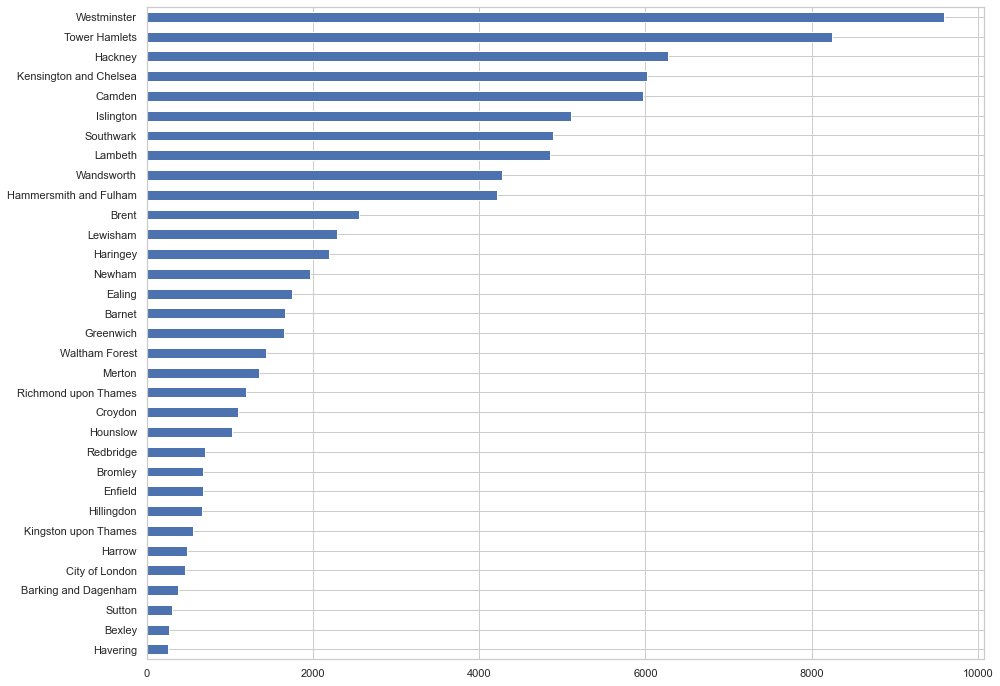

In [203]:
df_listings['neighbourhood'].value_counts(ascending=True).plot(kind='barh', figsize=(15,12))

In [204]:
london_centre_coords = [51.507515, -0.127802]

In [205]:
these_lats = df_listings['latitude'].tolist()
these_lons = df_listings['longitude'].tolist()
these_lat_lons = list(zip(these_lats, these_lons))

In [206]:
this_map_neighbourhood_1 = folium.Map(location=london_centre_coords,zoom_start=10.5)
    
FastMarkerCluster(data=these_lat_lons).add_to(this_map_neighbourhood_1) # this is a lot faster than the code above. Technique from Erik Bruin

this_map_neighbourhood_1
# this_map_neighbourhood_1.save('index.html')

## 2.XX Room type

Entire homes or apartments are the most popular room_types. There also appear to be some fairly expensive hotel rooms and private rooms. We will look at prices in a separate section.

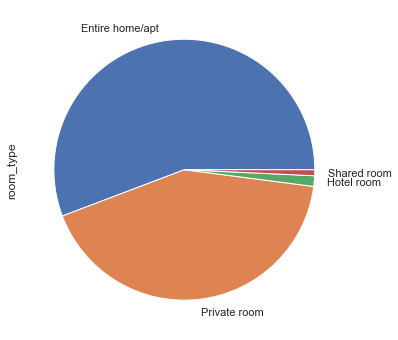

In [207]:
df_listings.room_type.value_counts().plot.pie(y='room_type', figsize=(6, 6))

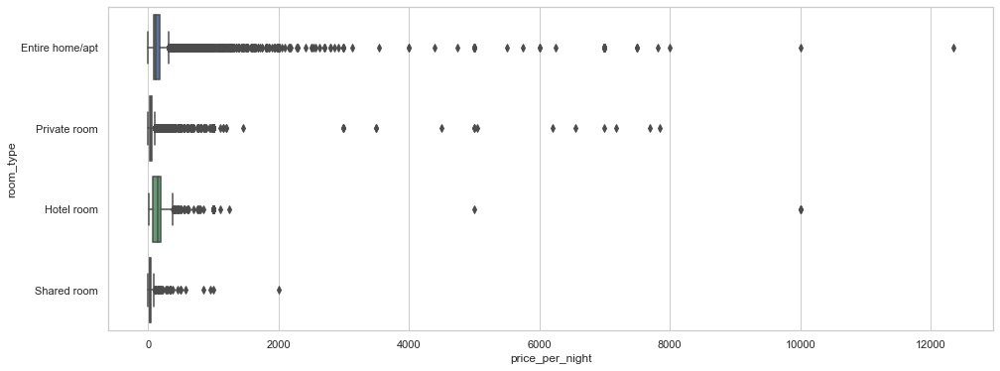

In [208]:
plt.figure(figsize=(16, 6))
ax = sns.boxplot(x="price_per_night", y="room_type", data=df_listings) #, showfliers=False) #uncomment if want to hide outliers

## 2.XX Property type

There are a lot more property types compared to room types. We likely won't use this feature in later analyses but worth inspecting now.

In [209]:
df_listings.property_type.value_counts(normalize=True)

Apartment                 0.661412
House                     0.210173
Condominium               0.035078
Townhouse                 0.035066
Serviced apartment        0.017504
Loft                      0.008758
Bed and breakfast         0.007582
Guest suite               0.004302
Guesthouse                0.003585
Boutique hotel            0.002762
Other                     0.002339
Hostel                    0.002198
Hotel                     0.001904
Bungalow                  0.001622
Cottage                   0.001081
Tiny house                0.000764
Boat                      0.000717
Villa                     0.000694
Aparthotel                0.000576
Houseboat                 0.000411
Cabin                     0.000235
Camper/RV                 0.000200
Earth house               0.000188
Chalet                    0.000141
Hut                       0.000129
Barn                      0.000094
Casa particular (Cuba)    0.000082
Farm stay                 0.000071
Yurt                

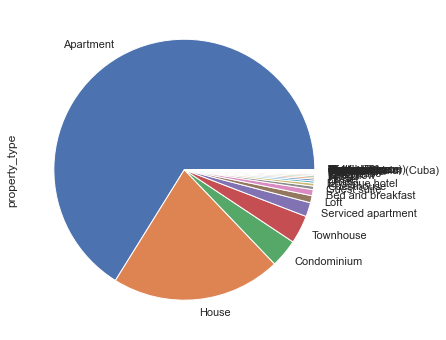

In [210]:
df_listings.property_type.value_counts().plot.pie(y='property_type', figsize=(6, 6))

## 2.XX Price per night

Let's study the price rates by room rates (we'll look at price against other dimensions such as neighbourhood in later sections of this notebook).

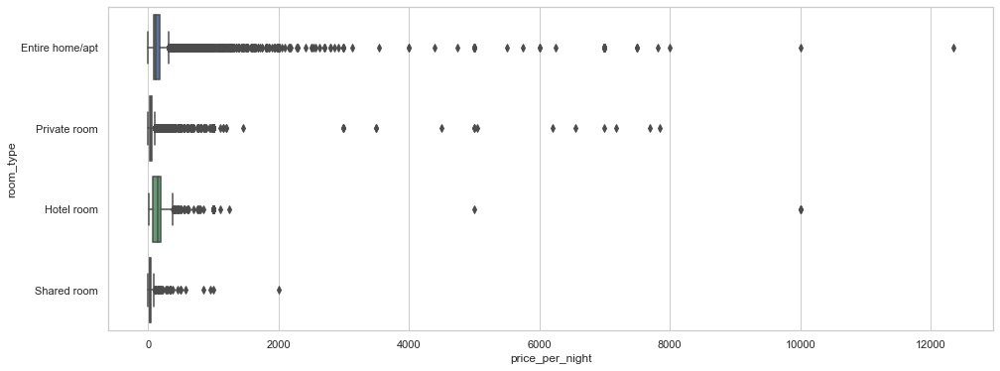

In [211]:
plt.figure(figsize=(16, 6))
ax = sns.boxplot(x="price_per_night", y="room_type", data=df_listings)

There appear to be some outliers in prices. Let's remove these and look at the distributions again:

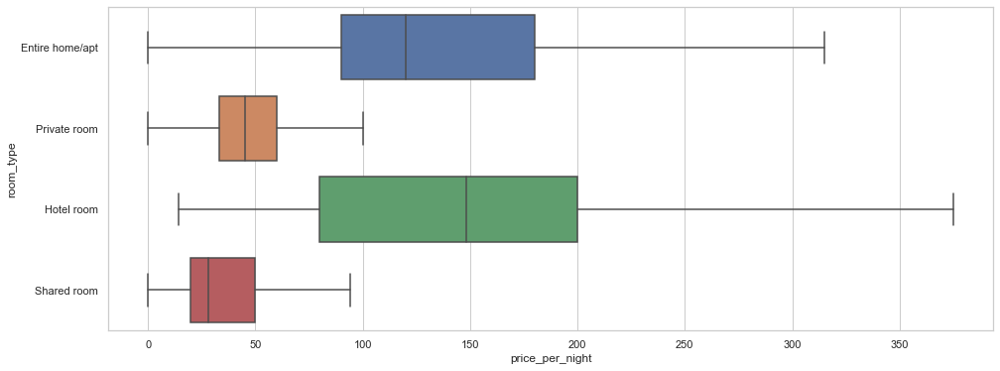

In [212]:
plt.figure(figsize=(16, 6))
ax = sns.boxplot(x="price_per_night", y="room_type", data=df_listings, showfliers=False)

## 2.XX Number of reviews

Typically, or at least for me, I tend to look closer at listings which have more reviews. It lends a certain sense of legitimacy to listings. Let's take a look at the top 10% of listings and see if their ratings are any different from the rest of the population.

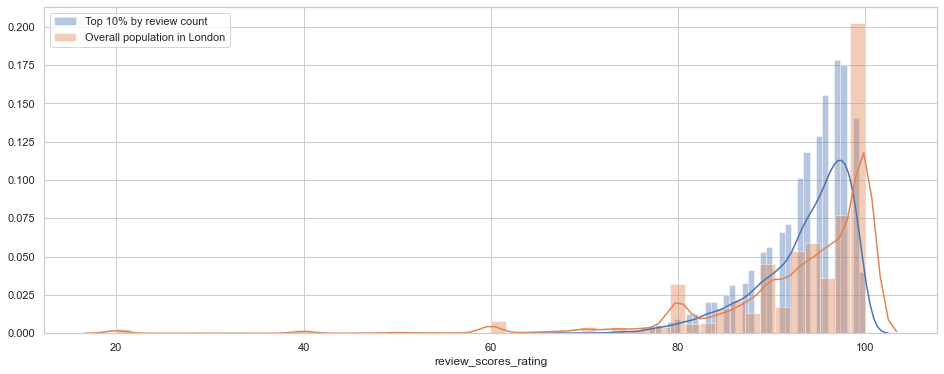

In [213]:
review_quantiles = df_listings['number_of_reviews'].quantile([.1, .25, .5, .75, 0.9]).to_frame()
temp_most_reviewed = df_listings[df_listings['number_of_reviews']>=review_quantiles[review_quantiles.index==0.9].values[0][0]].copy()

plt.figure(figsize=(16, 6))
sns.distplot(temp_most_reviewed['review_scores_rating'],kde = True, label="Top 10% by review count")
sns.distplot(df_listings['review_scores_rating'],kde = True, label="Overall population in London")
plt.legend()
plt.show()

Not quite. What about their price? Not much difference compared to the plots in section 2.XX. Therefore, difficult to say whether the ratings or price differs much according to number of reviews. Probably not much more than my own hunch anyway.

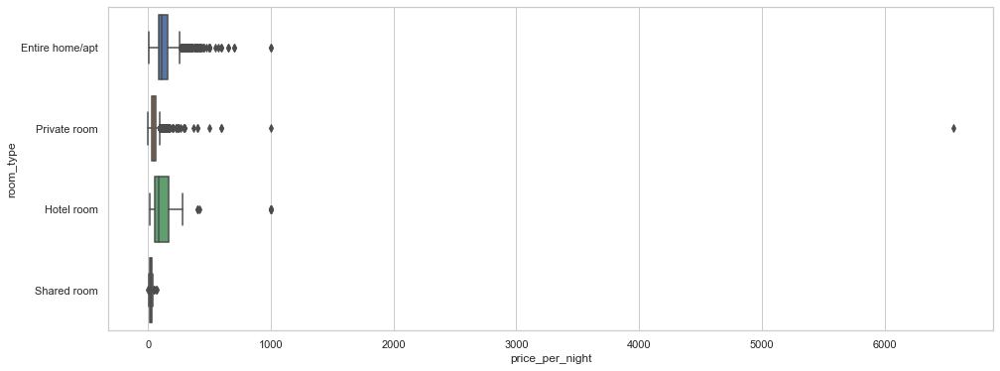

In [214]:
plt.figure(figsize=(16, 6))
ax = sns.boxplot(x="price_per_night", y="room_type", data=temp_most_reviewed)

We also noticed there are a few listings which have had more than 600 reviews. They look to have been around for some time based on the 'first_review' column.

In [215]:
df_listings['days_since_first_review'] = pd.to_datetime(df_listings['first_review'], format='%Y-%m-%d') # https://docs.python.org/3/library/datetime.html#strftime-and-strptime-behavior
df_listings['days_since_first_review'] = round((pd.to_datetime("now") - df_listings['days_since_first_review']) /np.timedelta64(1,'D'))
df_listings[df_listings['number_of_reviews']>=600]

,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price_per_night,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,property_type,accommodates,first_review,review_scores_value,review_scores_cleanliness,review_scores_location,review_scores_accuracy,review_scores_communication,review_scores_checkin,review_scores_rating,maximum_nights,listing_url,host_is_superhost,host_about,host_response_time,host_response_rate,street,market,host_identity_verified,bathrooms,bedrooms,beds,bed_type,experiences_offered,notes,neighborhood_overview,amenities,cleaning_fee,cancellation_policy,square_feet,days_since_first_review
1426,604185,Lovely Double in Islington Near tube. Zone 2,2990888,Marie,Islington,51.55406,-0.11737,Private room,44,1,616,2019-10-29,6.98,1,117,Apartment,2,2012-08-08,10.0,10.0,10.0,10.0,10.0,10.0,99.0,1125,https://www.airbnb.com/rooms/604185,t,We are a female couple who love meeting new pe...,within an hour,100%,"London, United Kingdom",London,t,1.0,1.0,1.0,Real Bed,business,There is a cinema up the road and an array of ...,We are close to so many things on the Piccadil...,"{""Cable TV"",Wifi,Kitchen,""Paid parking off pre...",NaN,strict_14_with_grace_period,NaN,2810.0
2255,1231053,COSY DOUBLE ROOM in the Heart of London | SOHO,6599538,Allen,Westminster,51.51264,-0.13154,Private room,68,1,606,2019-10-19,7.78,3,331,Apartment,2,2013-06-15,9.0,9.0,10.0,10.0,10.0,10.0,90.0,365,https://www.airbnb.com/rooms/1231053,f,Always busy at work. Love quiet nights in and ...,within a day,91%,"London, United Kingdom",London,f,1.0,1.0,1.0,Real Bed,none,London is the most visited city in the world a...,Staying here will affect you in terms of havin...,"{Wifi,Kitchen,""Paid parking off premises"",Heat...",NaN,strict_14_with_grace_period,NaN,2499.0
2550,1436172,Cosy Dble in Kings Cross Houseshare,7716401,Paul,Camden,51.53105,-0.12569,Private room,79,1,716,2019-10-27,9.58,4,290,Townhouse,2,2013-09-16,10.0,10.0,10.0,10.0,10.0,10.0,92.0,1125,https://www.airbnb.com/rooms/1436172,t,I'm a young professional working in central lo...,within an hour,100%,"London, United Kingdom",London,t,1.5,1.0,1.0,Real Bed,social,Fun and friendly host!,"Vibrant, funky and very close to the west end.","{TV,""Cable TV"",Wifi,Kitchen,Breakfast,Heating,...",NaN,moderate,NaN,2406.0
2551,1436177,En-suite Dbl @ Kings Cross Houshare,7716401,Paul,Camden,51.52731,-0.14007,Private room,95,1,627,2019-10-29,8.27,4,307,Townhouse,2,2013-08-16,10.0,10.0,10.0,10.0,10.0,10.0,94.0,1125,https://www.airbnb.com/rooms/1436177,t,I'm a young professional working in central lo...,within an hour,100%,"London, United Kingdom",London,t,1.5,1.0,1.0,Real Bed,social,Fun and friendly host!,"Vibrant, funky and very close to Camden and th...","{TV,""Cable TV"",Wifi,Kitchen,""Paid parking off ...",NaN,moderate,NaN,2437.0
12507,9046849,"Near HEATHROW AIRPORT, London, double room.",47205373,Ekaterina,Hillingdon,51.50517,-0.47408,Private room,33,1,658,2019-10-20,13.50,1,132,Townhouse,2,2015-11-06,10.0,10.0,10.0,10.0,10.0,10.0,97.0,1125,https://www.airbnb.com/rooms/9046849,t,Hi my name is Katy. I graduated from Art Coll...,within an hour,100%,"West Drayton, United Kingdom",London,f,1.5,1.0,1.0,Real Bed,none,1. The best way to pay for public transport in...,"The Green, surrounded by trees, leads to the S...","{Internet,Wifi,""Free parking on premises"",""Smo...",$0.00,flexible,NaN,1625.0


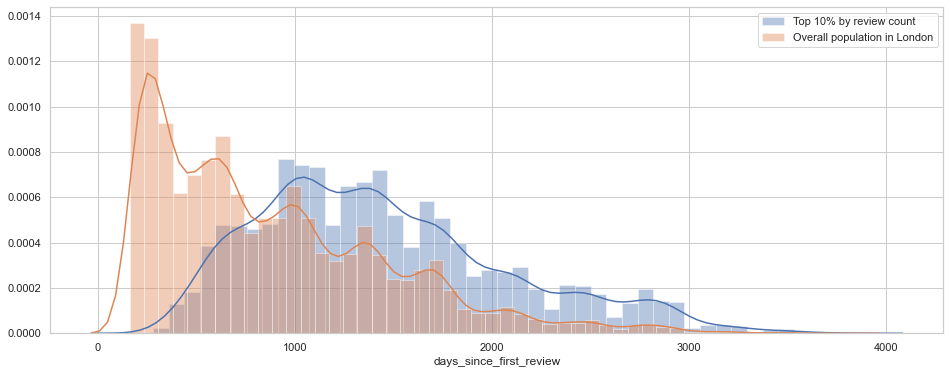

In [216]:
review_quantiles = df_listings['number_of_reviews'].quantile([.1, .25, .5, .75, 0.9]).to_frame()
temp_most_reviewed = df_listings[df_listings['number_of_reviews']>=review_quantiles[review_quantiles.index==0.9].values[0][0]].copy()

plt.figure(figsize=(16, 6))
sns.distplot(temp_most_reviewed['days_since_first_review'],kde = True, label="Top 10% by review count")
sns.distplot(df_listings['days_since_first_review'],kde = True, label="Overall population in London")
plt.legend()
plt.show()

Yes, this confirms our hunch - number of reviews is largely driven by how long a property has been listed. This makes sense. What else can we do to look at popularity?

## 2.XX Reviews per month

What if we looked at the number of reviews per month. Perhaps this is a better measure of popularity. 

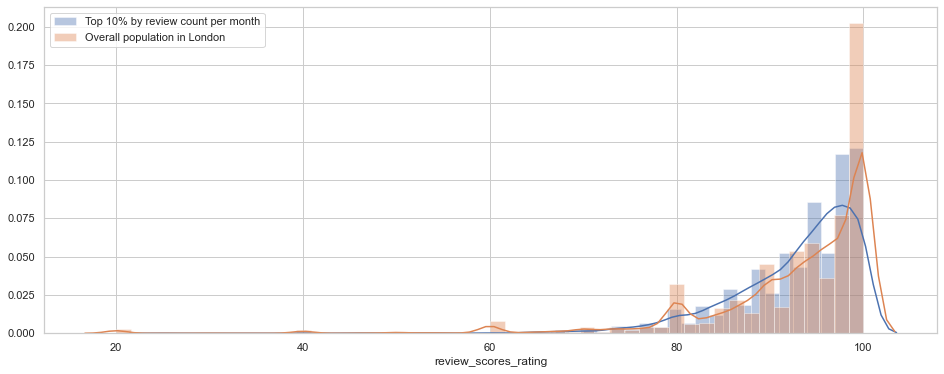

In [217]:
review_quantiles = df_listings['reviews_per_month'].quantile([.1, .25, .5, .75, 0.9]).to_frame()
temp_most_reviewed = df_listings[df_listings['reviews_per_month']>=review_quantiles[review_quantiles.index==0.9].values[0][0]].copy()

plt.figure(figsize=(16, 6))
sns.distplot(temp_most_reviewed['review_scores_rating'],kde = True, label="Top 10% by review count per month")
sns.distplot(df_listings['review_scores_rating'],kde = True, label="Overall population in London")
plt.legend()
plt.show()

Well, ratings don't differ much but we can see that price per night actually is not quite what we've seen before. Perhaps then having more reviews per month matters. Why though? Perhaps it's a sign of people booking your listing.

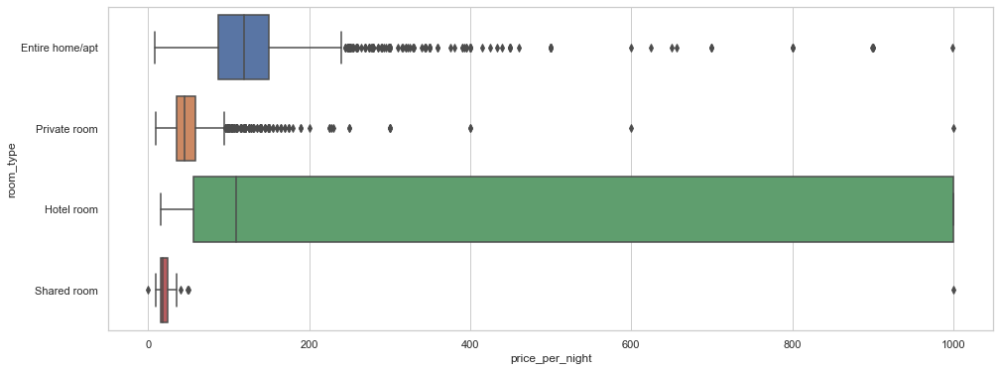

In [218]:
plt.figure(figsize=(16, 6))
ax = sns.boxplot(x="price_per_night", y="room_type", data=temp_most_reviewed)

Note as well as that in the top 10 by review count, distribution by room type is slightly different - private rooms are more popular than 'entire home/apt'

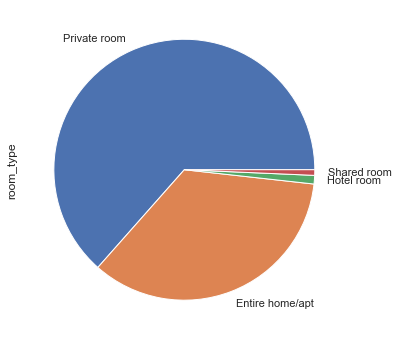

In [219]:
temp_most_reviewed.room_type.value_counts().plot.pie(y='room_type', figsize=(6, 6))

In [220]:
del temp_most_reviewed

## 2.XX Accomodates

Nothing much to say here. Some private rooms can accomodate quite a number of people. Shame the 'square_feet' column is not usable (too many missing values).

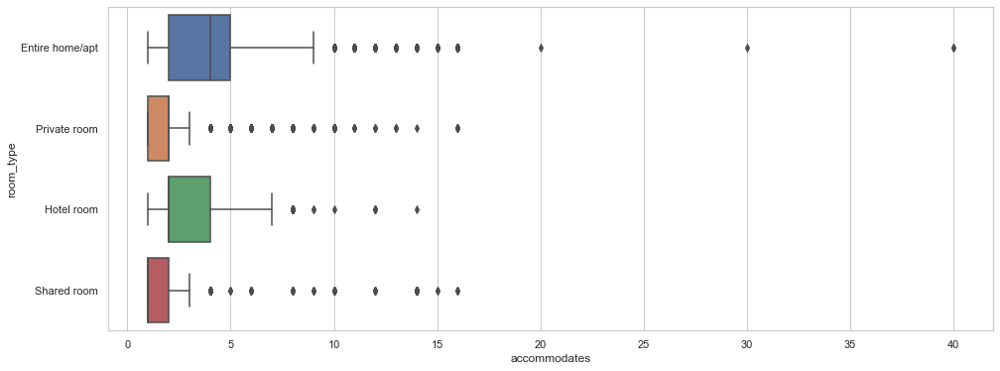

In [221]:
plt.figure(figsize=(16, 6))
ax = sns.boxplot(x="accommodates", y="room_type", data=df_listings)

## 2.XX Superhost

https://www.airbnb.com/help/article/829/how-do-i-become-a-superhost

"How do I become a Superhost?
To become a Superhost, you need to have an account in good standing and meet the following requirements. Your performance is measured over your previous 12 months of hosting. However, you do not need to have hosted for the full 12 months to qualify. Check your Superhost status.

Superhost requirements
Completed at least 10 trips OR completed 3 reservations that total at least 100 nights
Maintained a 90% response rate or higher
Maintained a 1% percent cancellation rate (1 cancellation per 100 reservations) or lower, with exceptions made for those that fall under our Extenuating Circumstances policy
Maintained a 4.8 overall rating (this rating looks at the past 365 days of reviews, based on the date the guest left a review, not the date the guest checked out)
Earning Superhost status
You don’t need to apply to become a Superhost. If you meet the program requirements on the quarterly assessment date, you'll qualify for Superhost status. Quarterly assessments begin on January 1st, April 1st, July 1st, and October 1st, every year. We’ll notify you of your Superhost status at the end of each assessment period—which usually finishes 5 days after the assessment begins. Only primary hosts are eligible to attain Superhost status."


Majority are not superhosts - this is good. It dilutes the value of 'superhost' if there are too many.

In [222]:
df_listings['host_is_superhost'].value_counts()

f    72303
t    12753
Name: host_is_superhost, dtype: int64

In [223]:
df_listings['host_response_time'].value_counts()

within an hour        37451
within a few hours    12170
within a day           7867
a few days or more     1680
Name: host_response_time, dtype: int64

In [224]:
df_listings['host_response_rate'] = df_listings['host_response_rate'].str.replace("%","")
df_listings['host_response_rate'] = df_listings['host_response_rate'].astype("float")
df_listings['host_response_rate'] = round(df_listings['host_response_rate']/10)*10

Superhosts are marginally more likely to respond promptly than those who are not superhosts.

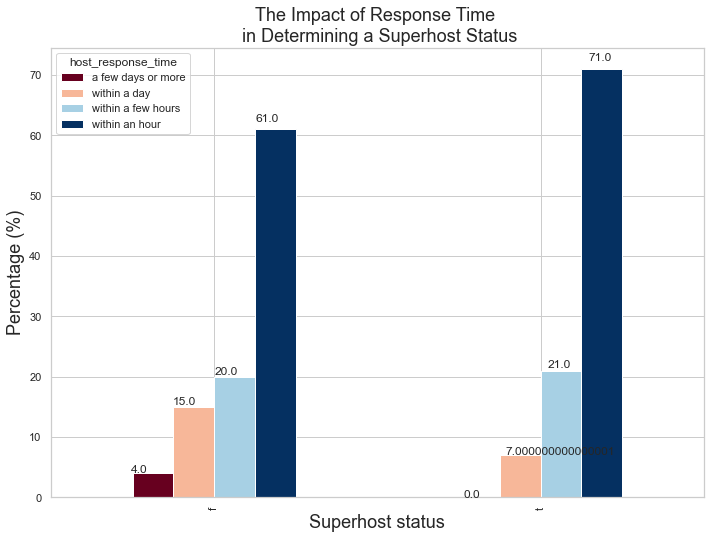

In [225]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.set_style('whitegrid')
# avg_duration = df['duration'].mean()

# lst = [df]
# df["duration_status"] = np.nan

# for col in lst:
#     col.loc[col["duration"] < avg_duration, "duration_status"] = "below_average"
#     col.loc[col["duration"] > avg_duration, "duration_status"] = "above_average"
    
pct_term = pd.crosstab(df_listings['host_is_superhost'], df_listings['host_response_time']).apply(lambda r: round(r/r.sum(), 2) * 100, axis=1)


ax = pct_term.plot(kind='bar', stacked=False, cmap='RdBu')
plt.title("The Impact of Response Time \n in Determining a Superhost Status", fontsize=18)
plt.xlabel("Superhost status", fontsize=18);
plt.ylabel("Percentage (%)", fontsize=18)

for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.02, p.get_height() * 1.02))
    

plt.show()

We also see that superhosts have a higher a proportion of 100% response rates.

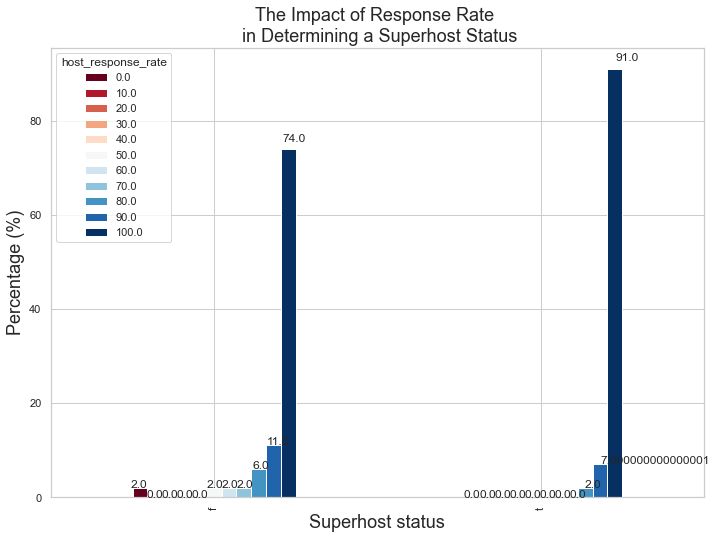

In [226]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.set_style('whitegrid')
# avg_duration = df['duration'].mean()

# lst = [df]
# df["duration_status"] = np.nan

# for col in lst:
#     col.loc[col["duration"] < avg_duration, "duration_status"] = "below_average"
#     col.loc[col["duration"] > avg_duration, "duration_status"] = "above_average"
    
pct_term = pd.crosstab(df_listings['host_is_superhost'], df_listings['host_response_rate']).apply(lambda r: round(r/r.sum(), 2) * 100, axis=1)


ax = pct_term.plot(kind='bar', stacked=False, cmap='RdBu')
plt.title("The Impact of Response Rate \n in Determining a Superhost Status", fontsize=18)
plt.xlabel("Superhost status", fontsize=18);
plt.ylabel("Percentage (%)", fontsize=18)

for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.02, p.get_height() * 1.02))
    

plt.show()

Superhosts are also likely to have verified identities.

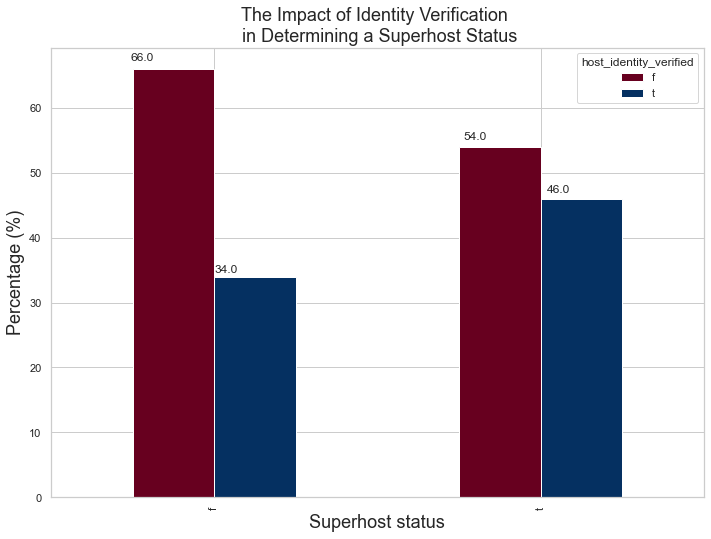

In [227]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.set_style('whitegrid')
# avg_duration = df['duration'].mean()

# lst = [df]
# df["duration_status"] = np.nan

# for col in lst:
#     col.loc[col["duration"] < avg_duration, "duration_status"] = "below_average"
#     col.loc[col["duration"] > avg_duration, "duration_status"] = "above_average"
    
pct_term = pd.crosstab(df_listings['host_is_superhost'], df_listings['host_identity_verified']).apply(lambda r: round(r/r.sum(), 2) * 100, axis=1)


ax = pct_term.plot(kind='bar', stacked=False, cmap='RdBu')
plt.title("The Impact of Identity Verification \n in Determining a Superhost Status", fontsize=18)
plt.xlabel("Superhost status", fontsize=18);
plt.ylabel("Percentage (%)", fontsize=18)

for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() * 1.02, p.get_height() * 1.02))
    

plt.show()

In [228]:
del pct_term

## 2.XX Bathrooms

We see some properties have an unusual number of bathrooms. Firstly some have quite a few bathrooms! Some of these really do not make sense. For example, how does a hotel room have so many bathrooms. Or for that matter, how does a shared room work with so many bathrooms. Are these shared rooms or hotels actually dormitories?

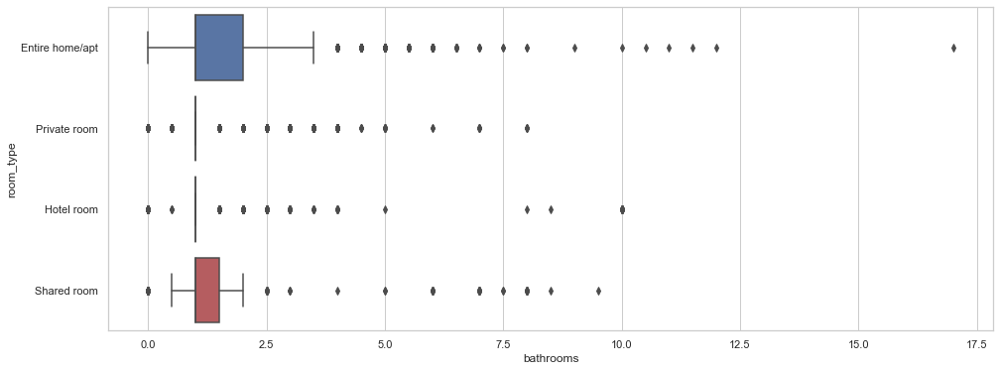

In [229]:
plt.figure(figsize=(16, 6))
ax = sns.boxplot(x="bathrooms", y="room_type", data=df_listings)

In [230]:
df_listings[(df_listings['bathrooms']>=2.5) & (df_listings['room_type']=='Private room')]['property_type'].value_counts(normalize=True)

House                 0.576366
Apartment             0.205128
Townhouse             0.137124
Bed and breakfast     0.016722
Condominium           0.015608
Boutique hotel        0.014493
Serviced apartment    0.013378
Other                 0.005574
Loft                  0.004459
Guesthouse            0.004459
Guest suite           0.003344
Bungalow              0.001115
Villa                 0.001115
Cabin                 0.001115
Name: property_type, dtype: float64

In [231]:
df_listings[(df_listings['bathrooms']>=2.5) & (df_listings['room_type']=='Hotel room')]['property_type'].value_counts(normalize=True)

Serviced apartment    0.457143
Hostel                0.300000
Bed and breakfast     0.214286
Hotel                 0.014286
Boutique hotel        0.014286
Name: property_type, dtype: float64

In [232]:
df_listings[(df_listings['bathrooms']>=2.5) & (df_listings['room_type']=='Shared room')]['property_type'].value_counts(normalize=True)

House             0.641509
Hostel            0.264151
Apartment         0.018868
Villa             0.018868
Loft              0.018868
Hotel             0.018868
Boutique hotel    0.018868
Name: property_type, dtype: float64

I am not quite sure how could have half a bathroom. Can't really say what property type this belongs to.

In [233]:
temp_df = df_listings[~(df_listings.isnull())]
temp_df[(temp_df['bathrooms'] != df_listings['bathrooms']// 1)]['property_type'].value_counts()

Apartment                 5389
House                     4774
Townhouse                  953
Condominium                441
Bed and breakfast          107
Serviced apartment          93
Loft                        84
Guest suite                 28
Guesthouse                  25
Other                       21
Cottage                     19
Hostel                      17
Bungalow                    16
Boat                        12
Tiny house                   9
Villa                        7
Hotel                        7
Houseboat                    5
Boutique hotel               4
Earth house                  3
Camper/RV                    3
Barn                         2
Chalet                       2
Yurt                         2
Hut                          2
Aparthotel                   1
Dome house                   1
Casa particular (Cuba)       1
Parking Space                1
Cabin                        1
Lighthouse                   1
Name: property_type, dtype: int64

In [234]:
del temp_df

## 2.XX Bedrooms and beds. Nothing untoward here.

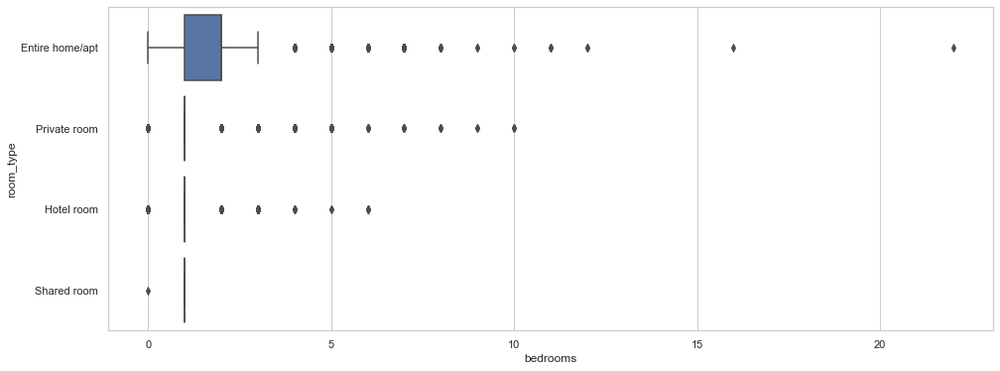

In [235]:
plt.figure(figsize=(16, 6))
ax = sns.boxplot(x="bedrooms", y="room_type", data=df_listings)

In [236]:
df_listings['bedrooms'].value_counts()

1.0     53151
2.0     17600
3.0      5948
0.0      5069
4.0      2245
5.0       721
6.0       177
7.0        39
8.0        13
10.0        5
9.0         4
11.0        3
12.0        2
16.0        1
22.0        1
Name: bedrooms, dtype: int64

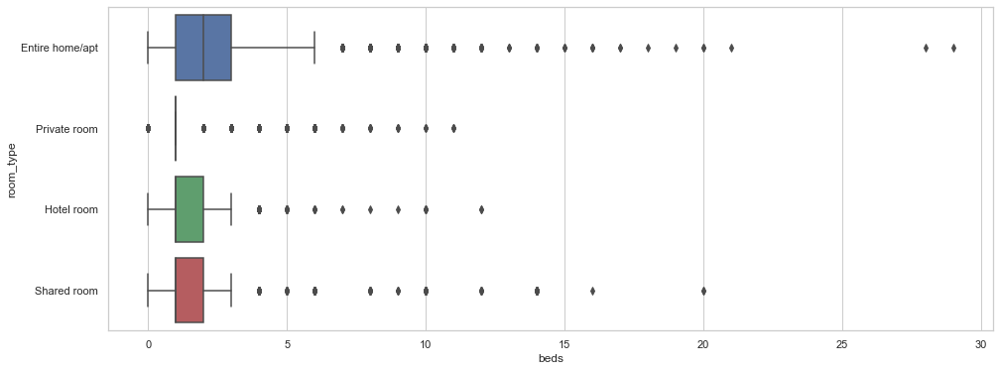

In [237]:
plt.figure(figsize=(16, 6))
ax = sns.boxplot(x="beds", y="room_type", data=df_listings)

## 2.XX Bed types

In [238]:
df_listings.bed_type.value_counts()

Real Bed         84395
Pull-out Sofa      397
Futon              172
Couch               66
Airbed              38
Name: bed_type, dtype: int64

## 2.XX Experiences offered

In [239]:
df_listings.experiences_offered.value_counts()

none        83388
business      582
family        479
social        411
romantic      208
Name: experiences_offered, dtype: int64

## 2.XX Cancellation policy

In [240]:
df_listings.cancellation_policy.value_counts()

strict_14_with_grace_period    36763
flexible                       27294
moderate                       20022
super_strict_60                  574
super_strict_30                  376
luxury_moderate                   27
strict                             8
luxury_super_strict_95             4
Name: cancellation_policy, dtype: int64

## 2.XX Amenities


In [241]:
list_amenities = df_listings.amenities.value_counts().index.tolist()
list_amenities = [re.sub('[""\{\}]','',s) for s in list_amenities]

unique_list = []
for x in list_amenities:
    unique_list.extend([y.upper().strip() for y in x.split(",") if y.upper().strip() not in unique_list])

print(len(unique_list))

228


In [242]:
unique_list.sort()
unique_list

['',
 '24-HOUR CHECK-IN',
 'ACCESSIBLE-HEIGHT BED',
 'ACCESSIBLE-HEIGHT TOILET',
 'AIR CONDITIONING',
 'AIR PURIFIER',
 'ALFRESCO BATHTUB',
 'AMAZON ECHO',
 'APPLE TV',
 'BABY BATH',
 'BABY MONITOR',
 'BABYSITTER RECOMMENDATIONS',
 'BALCONY',
 'BATH TOWEL',
 'BATHROOM ESSENTIALS',
 'BATHTUB',
 'BATHTUB WITH BATH CHAIR',
 'BBQ GRILL',
 'BEACH ESSENTIALS',
 'BEACH VIEW',
 'BEACHFRONT',
 'BED LINENS',
 'BEDROOM COMFORTS',
 'BIDET',
 'BODY SOAP',
 'BREAKFAST',
 'BREAKFAST BAR',
 'BREAKFAST TABLE',
 'BUILDING STAFF',
 'BUZZER/WIRELESS INTERCOM',
 'CABLE TV',
 'CARBON MONOXIDE DETECTOR',
 'CAT(S)',
 'CEILING FAN',
 'CEILING FANS',
 'CEILING HOIST',
 'CENTRAL AIR CONDITIONING',
 'CHANGING TABLE',
 'CHARCOAL BARBEQUE',
 "CHEF'S KITCHEN",
 'CHILDREN’S BOOKS AND TOYS',
 'CHILDREN’S DINNERWARE',
 'CLEANING BEFORE CHECKOUT',
 'COFFEE MAKER',
 'CONVECTION OVEN',
 'COOKING BASICS',
 'CRIB',
 'DAY BED',
 'DINING AREA',
 'DINING TABLE',
 'DISABLED PARKING SPOT',
 'DISHES AND SILVERWARE',
 'DISHWASHER'

There appear to quite a number of different amenities. Let's see if the absolute basics are available.

In [243]:
df_listings.amenities = df_listings.amenities.str.strip()
df_listings.amenities = df_listings.amenities.str.upper()
df_listings.amenities = df_listings.amenities.str.replace('[""\{\}]','')

In [244]:
df_listings["INTERNET"] = df_listings.apply(lambda row: 1 if any(t in row['amenities'] for t in ["INTERNET", "WIFI"]) else 0,axis=1)

df_listings["WASHER_DRYER"] = df_listings.apply(lambda row: 1 if any(t in row['amenities'] for t in ["WASHER", "WASHER / DRYER"]) else 0,axis=1)

df_listings["TV"] = df_listings.apply(lambda row: 1 if any(t in row['amenities'] for t in ["CABLE TV", "APPLE TV", "HBO GO", "NETFLIX", "SMART TV", "TV"]) else 0,axis=1)


for amenity in  ["BREAKFAST", "COOKING BASICS", "EN SUITE BATHROOM", "HEATING", "LOCKBOX", "HOT WATER"]:
    df_listings[amenity] = df_listings.apply(lambda row: 1 if amenity in row['amenities'] else 0,axis=1)
    
df_listings[["INTERNET","BREAKFAST", "COOKING BASICS", "EN SUITE BATHROOM", "HEATING", "LOCKBOX", "WASHER_DRYER", "HOT WATER", "TV"]].sum()    

INTERNET             82005
BREAKFAST            11214
COOKING BASICS       27411
EN SUITE BATHROOM      199
HEATING              80130
LOCKBOX               9762
WASHER_DRYER         73307
HOT WATER            46496
TV                   58833
dtype: int64

We'll study these in the next section.

## 2.XX Cleaning fee

In [245]:
df_listings.cleaning_fee = df_listings.cleaning_fee.str.replace('[$,]','')
df_listings.cleaning_fee = df_listings.cleaning_fee.astype(float)

In [246]:
df_listings["cleaning_fee_to_price"] = df_listings.cleaning_fee / df_listings.price_per_night

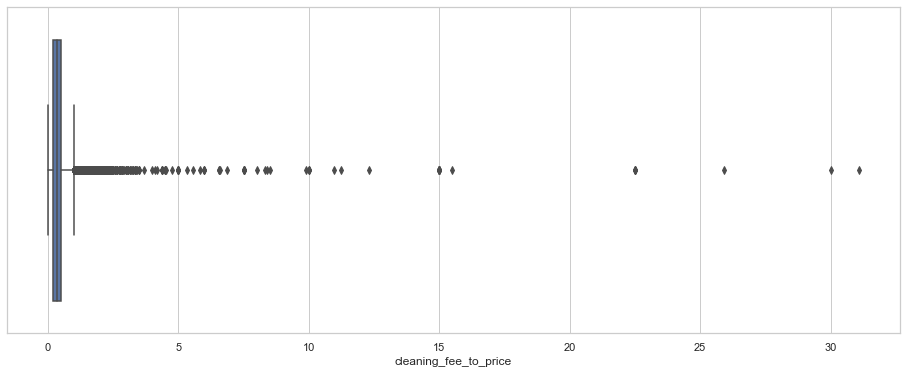

In [247]:
plt.figure(figsize=(16, 6))
ax = sns.boxplot(x="cleaning_fee_to_price", data=df_listings)

# 2.2) Exploratory analysis - calendar

In this section, we will study the various columns in our calendar dataset. The calendar has 365 records for each listing. It specifies the whether the listing is available on a particular day (365 days ahead), and the price on that day.

In [248]:
df_calendar.head()

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights
0,11551,2019-11-06,f,$105.00,$105.00,3.0,180.0
1,90700,2019-11-06,f,$125.00,$125.00,90.0,1125.0
2,90700,2019-11-07,f,$125.00,$125.00,90.0,1125.0
3,90700,2019-11-08,f,$125.00,$125.00,90.0,1125.0
4,90700,2019-11-09,f,$125.00,$125.00,90.0,1125.0


In [249]:
set(df_calendar.listing_id.value_counts().to_list())

{365, 366}

In [250]:
df_calendar.available.value_counts()

f    20898260
t    10151834
Name: available, dtype: int64

I can't quite make sense of what the minimum and maximum nights represent. I won't be using these variables.

In [251]:
print(df_calendar.minimum_nights.min(), df_calendar.minimum_nights.max())

1.0 1125.0


In [252]:
print(df_calendar.maximum_nights.min(), df_calendar.maximum_nights.max())

1.0 2147483647.0


In [253]:
df_calendar.drop(["minimum_nights","maximum_nights"],inplace=True,axis=1)

We see that this file has availability from Nov 2019 to Nov 2020. In subsequent sections, we will analyse how availability changes over time during this period, as well as behaviour of prices.

In [254]:
print(df_calendar.date.min(), df_calendar.date.max())

2019-11-05 2020-11-04


# 2.3) Exploratory analysis - reviews

In this section, we will study the various columns in our reviews_details dataset. This file holds the full details of all reviews. Taking help from Erik Bruin's amazing notebook, we'll try to do some text mining.

In [255]:
df_reviews_details.comments.fillna('', inplace=True)
df_reviews_details.head()

,listing_id,id,date,reviewer_id,reviewer_name,comments
0,11551,30672,2010-03-21,93896,Shar-Lyn,"The flat was bright, comfortable and clean and..."
1,11551,32236,2010-03-29,97890,Zane,We stayed with Adriano and Valerio for a week ...
2,90700,337227,2011-06-27,311071,Miqua,it was all in all the perfect week!\r\nchilton...
3,90700,378738,2011-07-17,224367,Prateek,"I'll start with the host, and then move on to ..."
4,90700,543840,2011-09-18,1115024,Jennifer,Great location. Plenty to do just steps outsid...


Looks like it may be useful to match these with host details such as host name, whether they were a super host or not. We can contextualise the review comments with the overall review scores, and perhaps by geographical region. Perhaps reviews comments are harsher for central london because of prices? It would then make sense to compare review comments with the price per night. We'll tackle this in subsequent sectios.

One thing to note though is we are not quite sure what date refers to - it likely refer to when the review was posted, not when the reviewer was staying at this property. We need to be mindful of this.

In this next section, we will attempt to build analytics that can help various parties. We will term them "Decision Support Analytics".

# 3) Decision Support Analytics

## 3.XX How do prices behave over time?

We see the following:

1. Prices are high on new year's eve
2. prices are high during summer months
3. Westminster, Camden, Kensington, City of London consistently price higher than other boroughs. This makes sense! Central London!
4. For some odd reason, prices shoot up in Nov 2020!

In [256]:
df_calendar = pd.merge(df_calendar,
                       df_listings[['id','room_type','neighbourhood']],
                       left_on='listing_id',
                       right_on='id',
                       how='left')


df_calendar["price"] = df_calendar["price"].str.replace(",","")
df_calendar["price"] = df_calendar["price"].str.replace("$","")
df_calendar["price"] = df_calendar["price"].astype(float)

df_grouped = df_calendar.groupby(["room_type","date","neighbourhood"])["price"].median()
df_grouped.fillna(0,inplace=True)
df_grouped = df_grouped.unstack("room_type")
df_grouped = df_grouped.reset_index()

for this_room in list(df_listings.room_type.unique()):
    fig = px.line(df_grouped, x="date", y=this_room, color='neighbourhood')
    fig.update_layout(title_text='Median price over time by neighbourhood - {}'.format(this_room))
    fig.update_xaxes(title_text='Date')
    fig.update_yaxes(title_text='Price')#,range=[df_grouped[df_listings.room_type.unique()].min().min(), df_grouped[df_listings.room_type.unique()].max().max()])
    fig.show()

## 3.X.X Can the data tell me what's different about listings which have low review scores vs those who have high review scores?

Looks like most listings tend to have higher scores. There are a few on the lower end, but generally higher scores make sense - a listing is unlikely to survive very long if it has poor scores. Also, perhaps visitors aren't quite as keen to post negative reviews than they are to review positively. Something to ponder. 

As highlighted by Erik Bruin, here's an article that address this point about AirBnB reviews: https://mashable.com/2015/02/25/airbnb-reviews-above-average/?europe=true#1YLfzOC34sqd

If we look at the threshold scores for the bottom 5% according to each component, we see different thresholds. What this tells us is that even the lowest scoring listings tend to have relatively high scores for certain components.

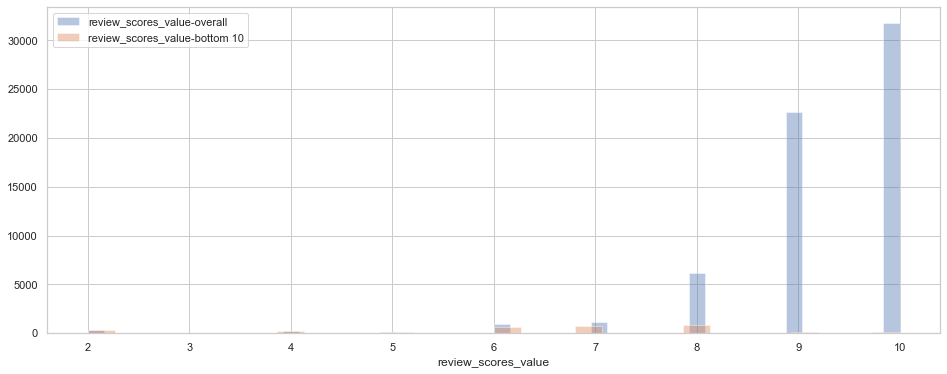

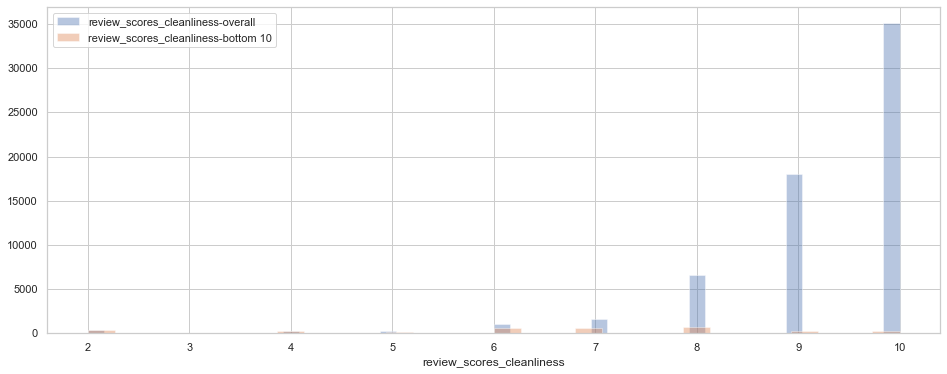

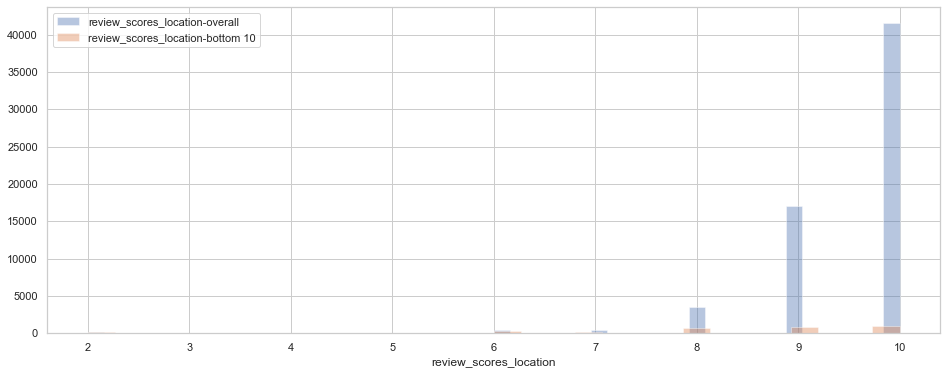

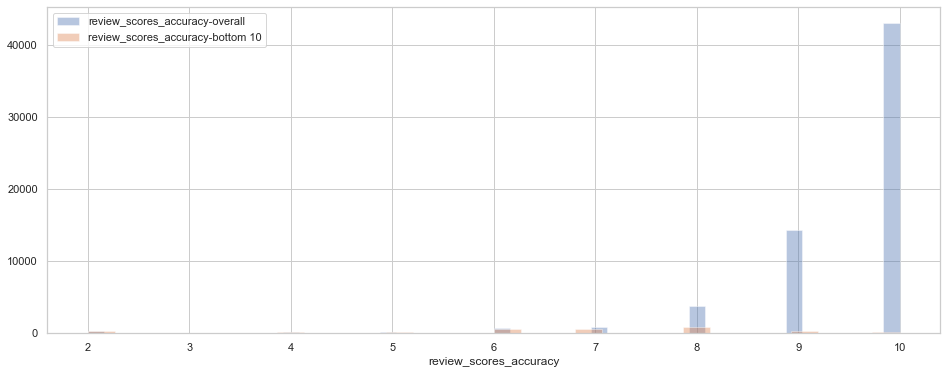

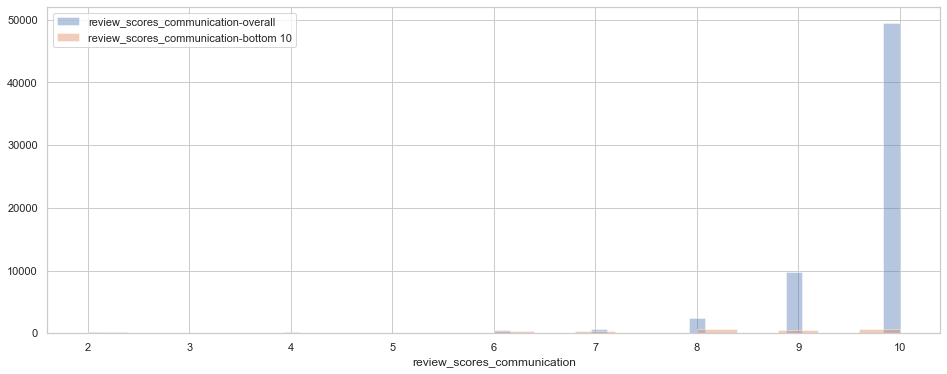

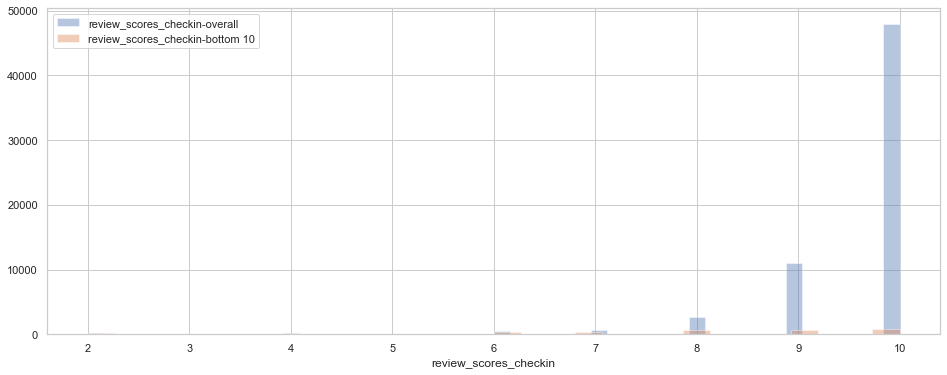

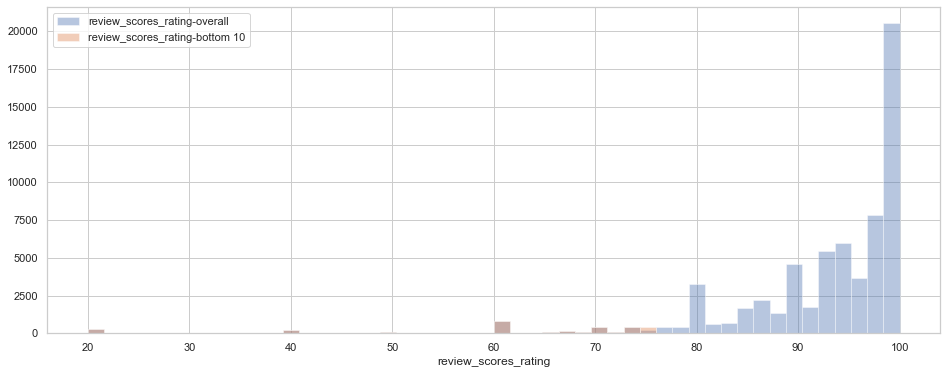

In [258]:
bottom_thresh = df_listings['review_scores_rating'].quantile([0.05, .1, .25, .5, .75, 0.9, 0.95]).values[0]
bottom_listings = df_listings[df_listings["review_scores_rating"]<=bottom_thresh].copy()
#len(bottom_listings)

for rev_col in [x for x in bottom_listings.columns.tolist() if x.startswith("review_scores")]:

    plt.figure(figsize=(16, 6))
    sns.distplot(df_listings[rev_col],kde = False, label="{}-overall".format(rev_col))
    sns.distplot(bottom_listings[rev_col],kde = False, label="{}-bottom 10".format(rev_col))
    plt.legend()
    plt.show()

In [259]:
for rev_col in [x for x in bottom_listings.columns.tolist() if x.startswith("review_scores")]:
    print("Median {}-overall: {:.2f}".format(rev_col,df_listings[rev_col].median()), "Median {}-bottom 5%: {:.2f}".format(rev_col,bottom_listings[rev_col].median()),"\n")

Median review_scores_value-overall: 10.00 Median review_scores_value-bottom 5%: 7.00 

Median review_scores_cleanliness-overall: 10.00 Median review_scores_cleanliness-bottom 5%: 7.00 

Median review_scores_location-overall: 10.00 Median review_scores_location-bottom 5%: 9.00 

Median review_scores_accuracy-overall: 10.00 Median review_scores_accuracy-bottom 5%: 7.00 

Median review_scores_communication-overall: 10.00 Median review_scores_communication-bottom 5%: 8.00 

Median review_scores_checkin-overall: 10.00 Median review_scores_checkin-bottom 5%: 8.00 

Median review_scores_rating-overall: 96.00 Median review_scores_rating-bottom 5%: 65.00 



For simplicity, let's look at listings which score a 7 or below for each component score and see what kind of comments are submitted vs the general population.

In [260]:
def my_generate_wordcloud(this_df,title):
    
    this_merged_df = pd.merge(this_df,
                  df_reviews_details,
                  left_on='id',
                  right_on='listing_id',
                  how='left')
    this_merged_df.comments.fillna('', inplace=True)

    # https://medium.com/@cristhianboujon/how-to-list-the-most-common-words-from-text-corpus-using-scikit-learn-dad4d0cab41d
    this_vectorizer = CountVectorizer(stop_words="english")
    these_comments = this_merged_df.comments.tolist()
    X = this_vectorizer.fit_transform(these_comments) #get cleaned text and word counts in each comment, returns an array
    total_counts = X.sum(axis=0) #sum counts by word (word is a column in matrix)
    count_by_word = [(word, total_counts[0, idx]) for word, idx in this_vectorizer.vocabulary_.items()] #get counts by word in an array of word, count pairs

    df_count_by_word = sorted(count_by_word, key = lambda x: x[1], reverse=True)
    df_count_by_word = pd.DataFrame.from_records(df_count_by_word,columns=['Words','Frequency']).sort_values(["Frequency"],ascending=False)

    # https://stackoverflow.com/questions/43043437/wordcloud-python-with-generate-from-frequencies
    dict_count_by_word = dict(zip(df_count_by_word.Words,df_count_by_word.Frequency))
    # Relative scaling value is to adjust the importance of a frequency word.
    wordcloud = WordCloud(width=900,height=500, max_words=1628,relative_scaling=1,normalize_plurals=False).generate_from_frequencies(dict_count_by_word)
    print("Wordcloud - {}".format(title))
    plt.figure( figsize=(20,10) )
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()

Wordcloud - overall listings


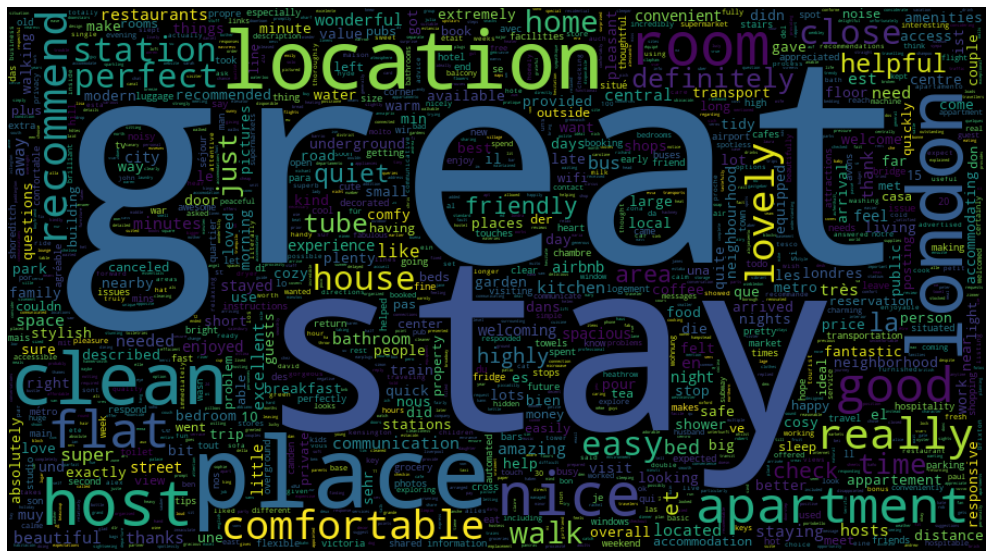

Wordcloud - score <=7 in review_scores_value


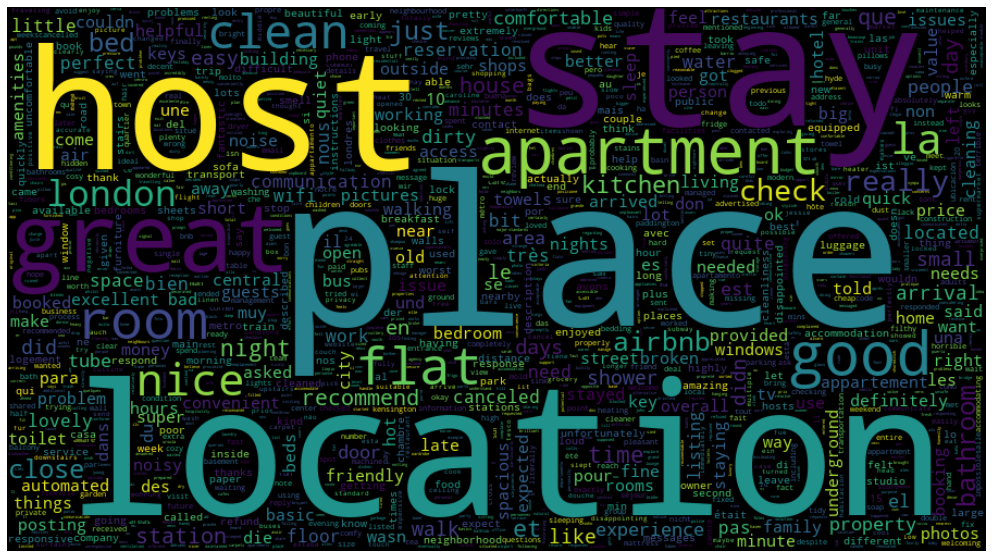

Wordcloud - score <=7 in review_scores_cleanliness


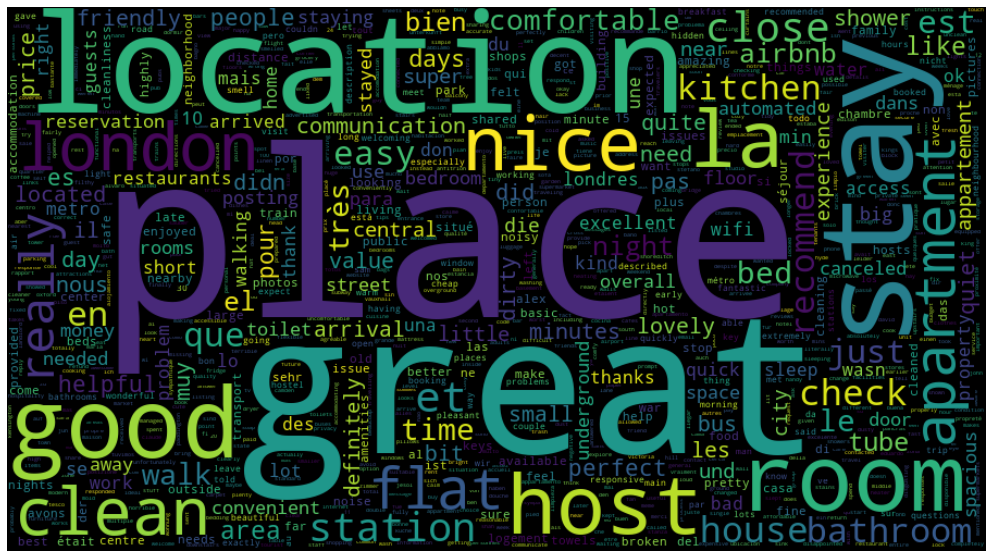

Wordcloud - score <=7 in review_scores_location


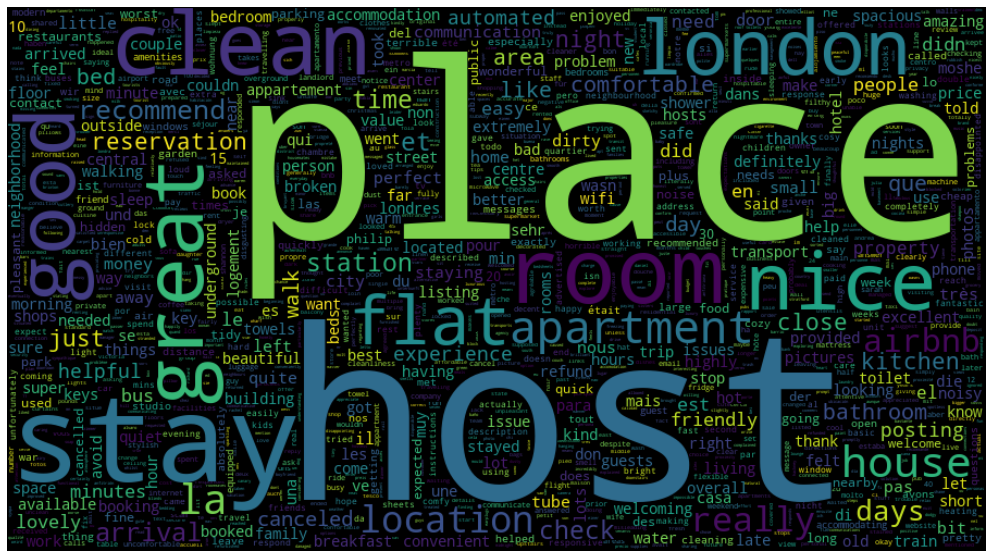

Wordcloud - score <=7 in review_scores_accuracy


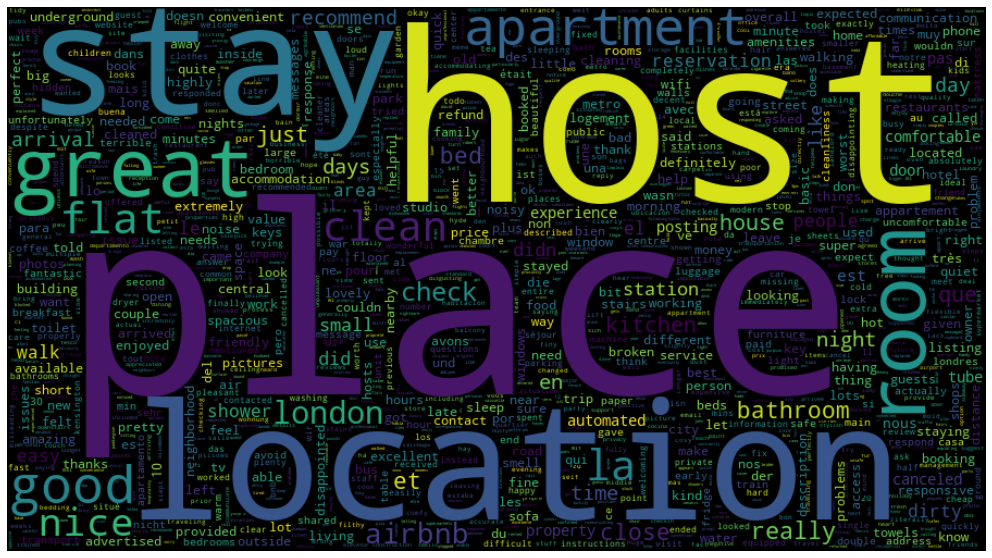

Wordcloud - score <=7 in review_scores_communication


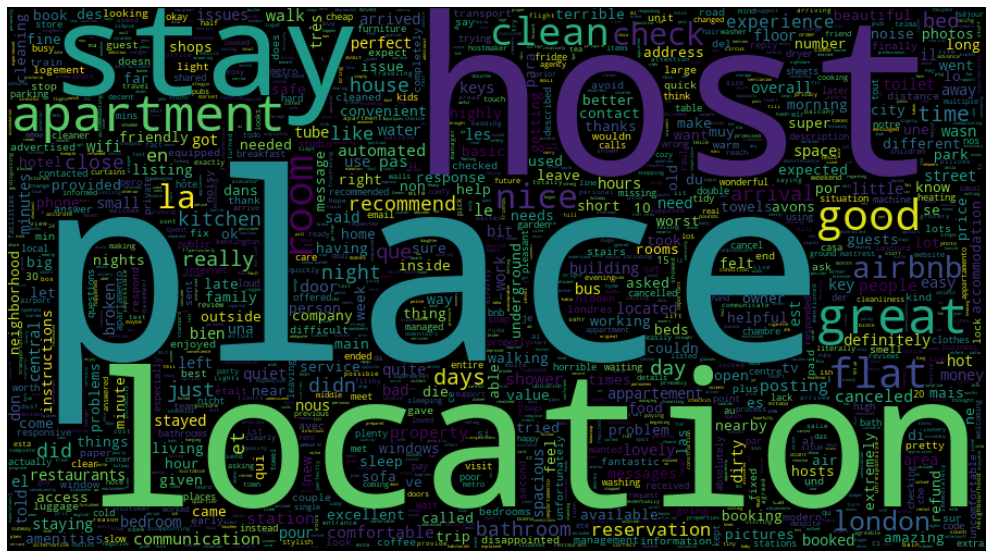

Wordcloud - score <=7 in review_scores_checkin


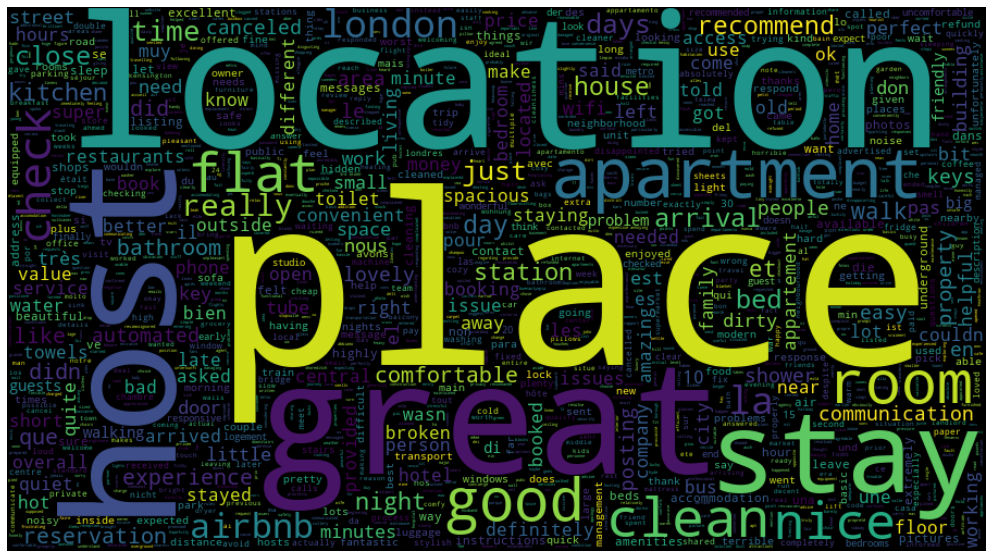

In [261]:

my_generate_wordcloud(df_listings,"overall listings")

for rev_col in [x for x in bottom_listings.columns.tolist() if x.startswith("review_scores")]:
    if rev_col != "review_scores_rating":
        bottom_listings = df_listings[df_listings[rev_col]<=7].copy()
        my_generate_wordcloud(bottom_listings,"score <=7 in {}".format(rev_col))
        
        
del bottom_listings, df_reviews_details

I can't quite spot anything amiss. Looks like generally all listings on AirBnB score highly. Whether this is true or artificial, I leave that to you to ponder.

## 3.XX What is the availability of listings over time?

From the graph below, we can see the following:

1. Availability appears to increase up to around Christmas before hitting a low on New Year's Eve. This indicates high bookings during festive seasons.
2. Availability again drops in early Feb, could this be during uni term holidays?
3. Further into the future, availability is generally lower.

Note however, availability is marked as false if a. the property is booked, or b. the owner has not marked it as available for some reason. Therefore, reason 3. above can likely be explained by owners not thinking too far into the future.

In [263]:
# df_calendar = pd.merge(df_calendar,
#                        df_listings[['id','neighbourhood']],
#                        left_on='listing_id',
#                        right_on='id',
#                        how='left')


df_calendar.drop("id",inplace=True,axis=1)

# https://stackoverflow.com/a/35415751
df_grouped = df_calendar.groupby(["date","neighbourhood","available"])["listing_id"].count().unstack('available')

df_grouped.fillna(0,inplace=True)
df_grouped = df_grouped.apply(lambda r: r/r.sum(),axis=1)
df_grouped = df_grouped.reset_index()
df_grouped.drop("f",axis=1,inplace=True)

fig = px.line(df_grouped, x="date", y="t", color='neighbourhood')
fig.update_layout(title_text='Availability over time by neighbourhood')
fig.update_xaxes(title_text='Date')
fig.update_yaxes(title_text='% Availability',range=[0, 1])
fig.show()